# Basic notebook for benchmarking tribus results

## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from os import listdir
from os.path import isfile, join
import scipy.stats as stats
from sklearn import preprocessing
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib
from umap import UMAP
import math
import matplotlib.backends.backend_pdf
from matplotlib.patches import Patch
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import matthews_corrcoef

/Users/farateod/Documents/GitHub/tribus/venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
palette = sns.dark_palette("#FF0000", as_cmap=True)
matplotlib.cm.register_cmap("mycolormap", palette)

## Change these parameters

In [3]:
sample_name = 'NKI-TMA-CyCIF-core10'
date = 'testing_sample_phenograph_log_01_20'
level = 'Global'

## Get the input data

### File paths

In [4]:
#TODO documentation about files
sample_path = f'../tests/{sample_name}/cell_type_calling/input_data_logtrans_01norm/'
cell_type_path = f'../tests/{sample_name}/cell_type_calling/cell_type_description.xlsx'
labels_path = f'../tests/{sample_name}/cell_type_calling/{date}'
score_path = f'../tests/{sample_name}/cell_type_calling/{date}/celltype_scores/'

### Read files

In [5]:
cell_type_description = pd.read_excel(cell_type_path, sheet_name=level)
all_markers = list(cell_type_description['Marker'])
cell_type_description = cell_type_description.set_index('Marker')
filtered_markers = list(cell_type_description.loc[(cell_type_description!=0).any(axis=1)].index)
cell_type_description_filtered = cell_type_description.loc[filtered_markers]

In [6]:
samples = [f for f in listdir(sample_path) if isfile(join(sample_path, f))]
score_files = [f for f in listdir(score_path) if isfile(join(score_path, f))]
nr_of_samples = len(samples)
#TODO skip hidden files while iterate through the folder

In [7]:
all_samples = []
filtered_samples = []
cell_type_subsets = []
cell_type_subsets_filtered = []
all_cell_types = []
celltype_scores = []
data_scores = []
data_scores_filtered = []
for sample in samples:
    #reading the sample and the result file
    sample_file = pd.read_csv(sample_path + sample)
    sample_file = sample_file[all_markers]
    labels = pd.read_csv(f'{labels_path}/labels_{sample}')['label.1']

    scores = pd.read_csv(f'{score_path}/scores_{sample}', index_col='label')
    data_score = pd.read_csv(f'{score_path}/data_to_scores_{sample}', index_col='label')
    data_score_filtered = data_score[filtered_markers]

    #filtering the sample file by used markers and use the result in the sample dataframe
    sample_file.loc[:, 'labels'] = labels
    filtered_sample = sample_file[[*filtered_markers, 'labels']]

    #add the sample into the samples list
    all_samples.append(sample_file)
    filtered_samples.append(filtered_sample)
    celltype_scores.append(scores)
    data_scores.append(data_score)
    data_scores_filtered.append(data_score_filtered)
    #subsetting the sample by cell types (labels)
    subsets_all = []
    subsets_filtered = []
    cell_types = list(np.unique(labels))
    for cell_type in cell_types:
        subsets_all.append(sample_file.loc[sample_file['labels'] == cell_type])
        subsets_filtered.append(filtered_sample.loc[filtered_sample['labels'] == cell_type])

    cell_type_subsets.append(subsets_all)
    cell_type_subsets_filtered.append(subsets_filtered)
    all_cell_types.append(cell_types)

## Correlation matrices

In [8]:
def get_correlation_matrix(table, markers):
    correlation_mx = pd.DataFrame()
    for marker1 in markers:
        correlations = []
        for marker2 in markers:
            correlations.append(np.corrcoef(list(table[marker1]), list(table[marker2]))[0, 1])
        correlation_mx[marker1] = correlations
    correlation_mx.index = markers
    return correlation_mx

In [9]:
def vis_corr_mx_one_sample(sample, subsets, markers, cell_types, sample_name):
    pdf = matplotlib.backends.backend_pdf.PdfPages(f"{sample_name}PhenoGraph2.pdf")
    whole_sample_corr_mx = get_correlation_matrix(sample, markers)
    sns.clustermap(whole_sample_corr_mx, figsize=(10, 10), cmap='vlag').fig.suptitle(
        f'Whole sample correlation {sample_name}', fontweight="bold", y=0.99)



    corr_matrices = []
    for table in subsets:
        corr_matrices.append(get_correlation_matrix(table, markers))

    for i in range(len(corr_matrices)):
        sns.clustermap(corr_matrices[i], figsize=(10, 10), cmap='vlag').fig.suptitle(f'{cell_types[i]} {sample_name}',fontweight="bold",y=0.99)

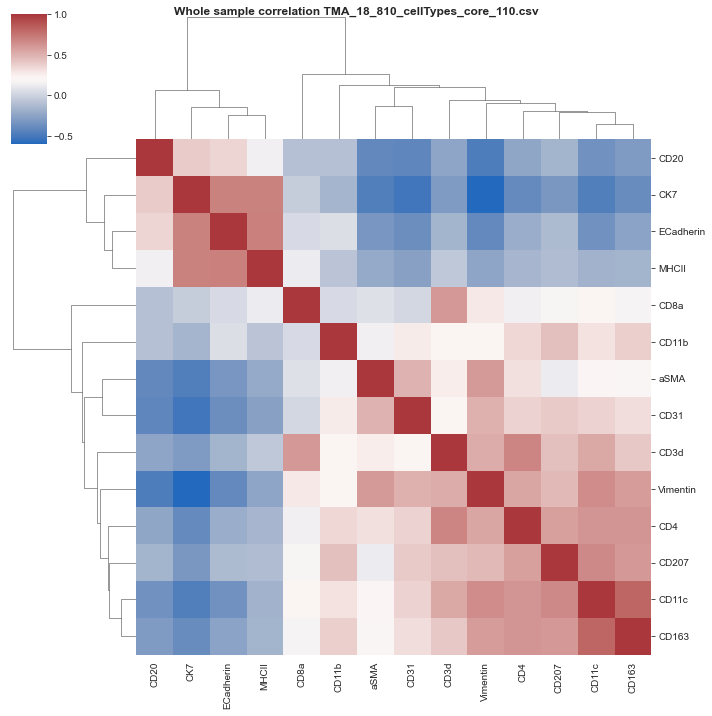

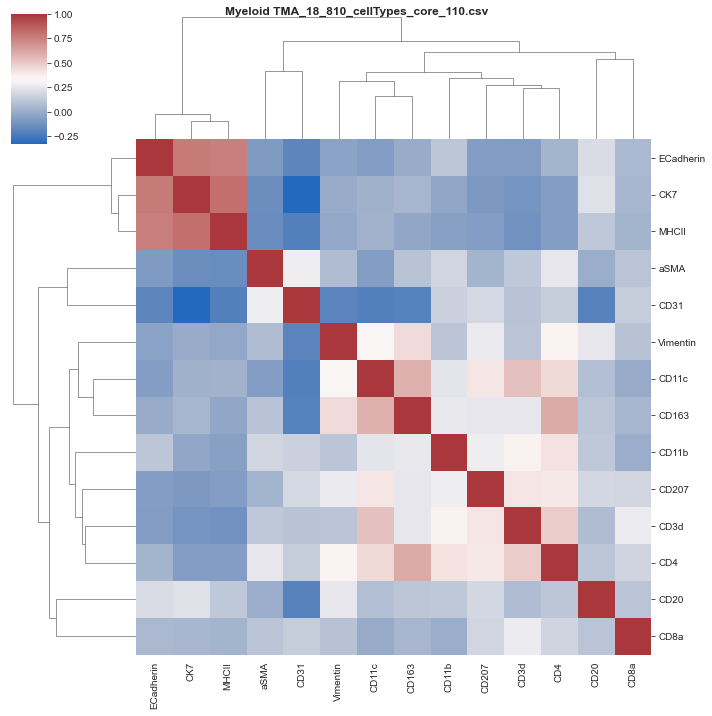

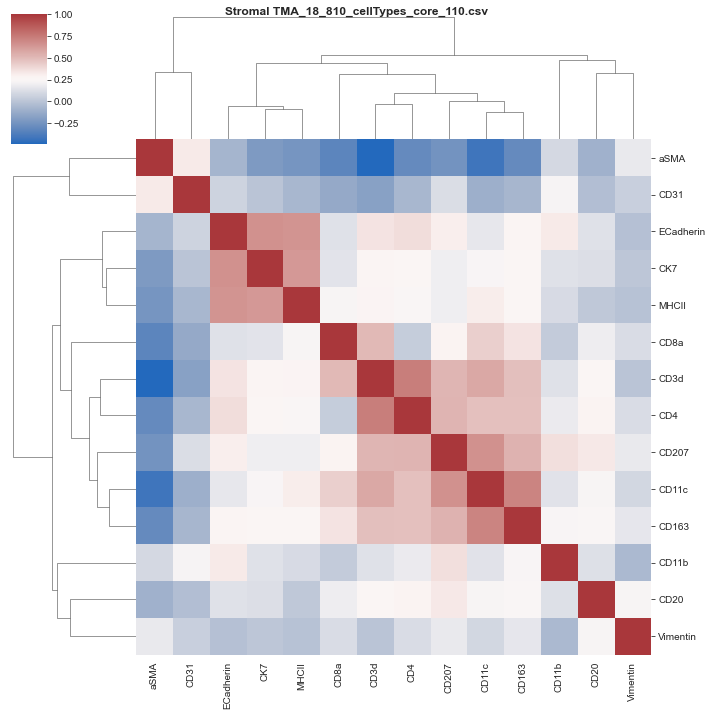

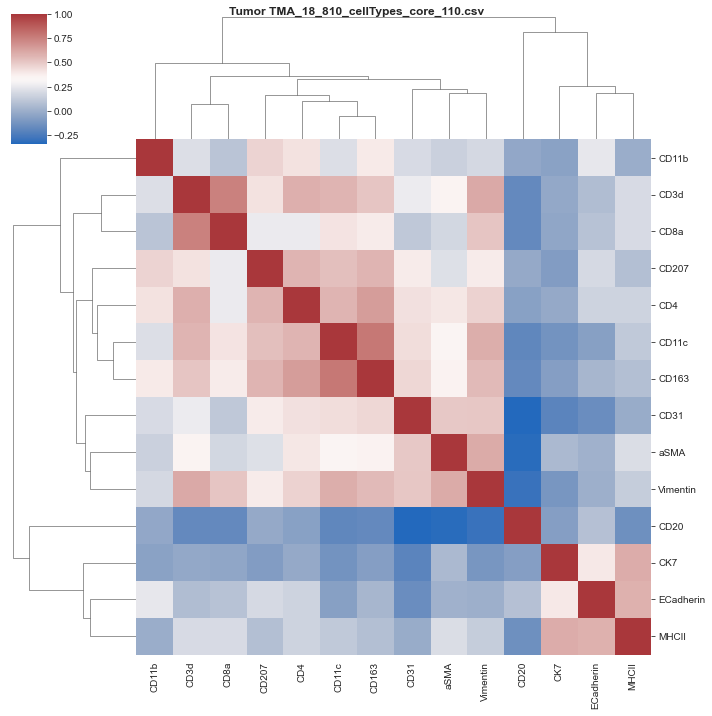

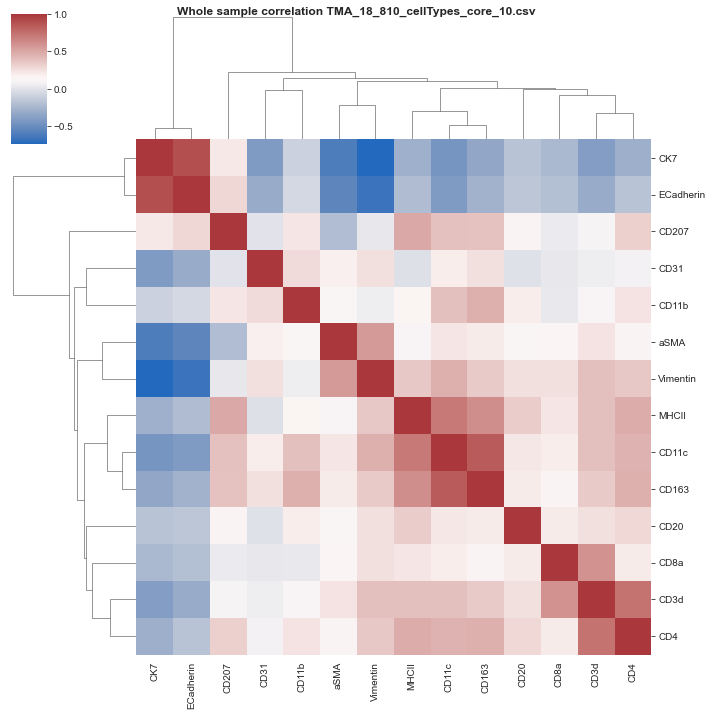

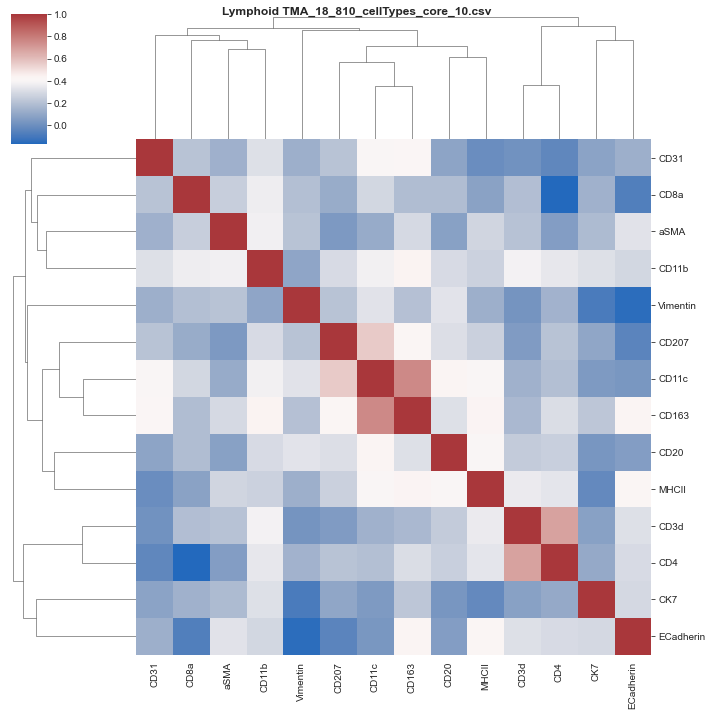

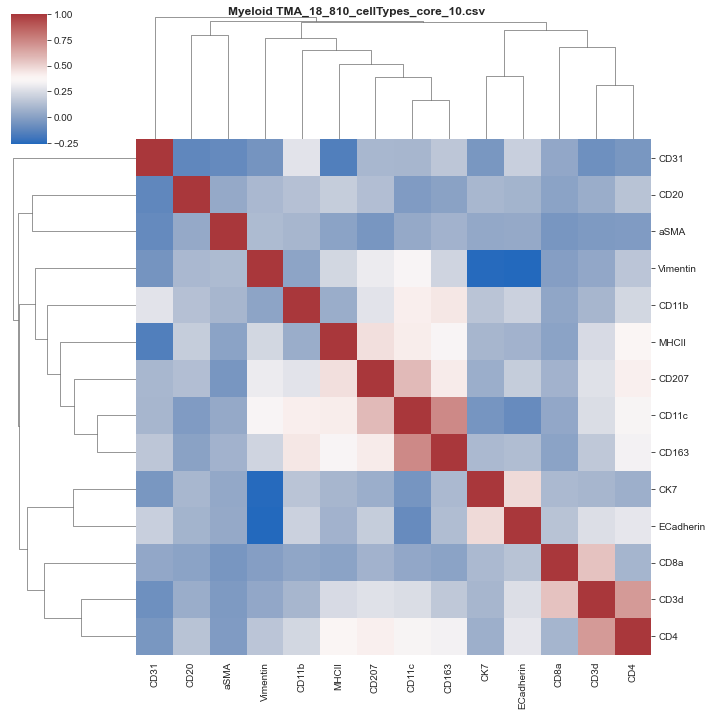

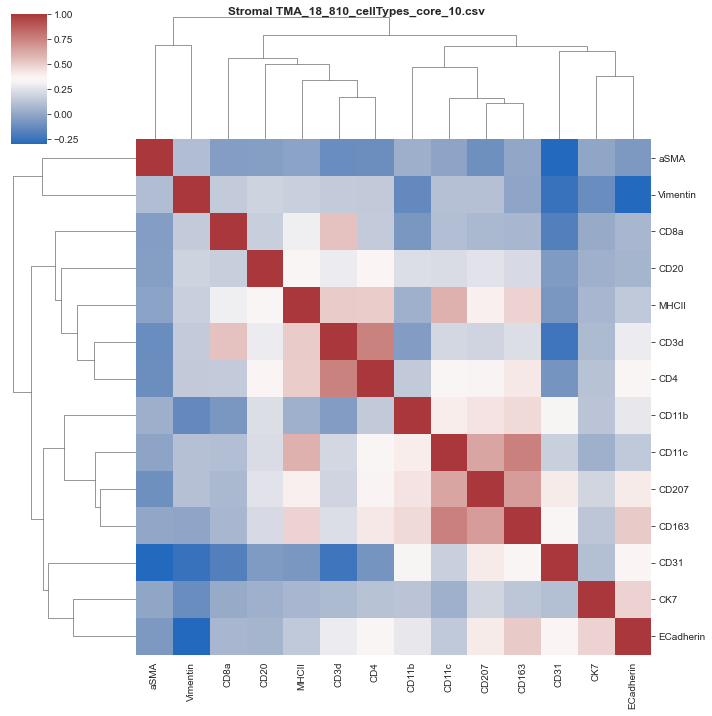

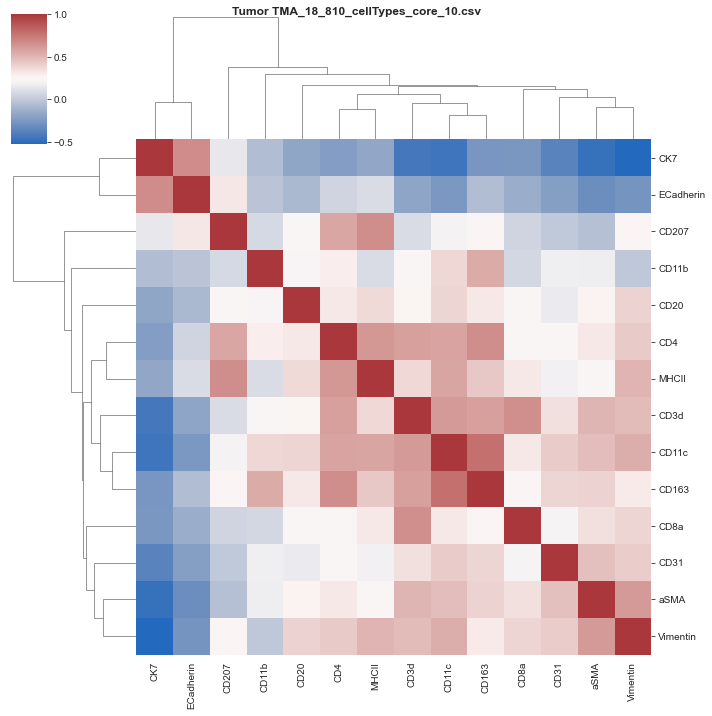

In [11]:
for i in range(nr_of_samples):
    vis_corr_mx_one_sample(all_samples[i], cell_type_subsets[i], all_markers, all_cell_types[i], samples[i])

## Heatmaps of marker expressions

In [12]:
def no_trans(table):
    return table

In [13]:
def get_heatmap(tables, cell_types, sample_name, transform, desciption_table):
    df_median = pd.DataFrame()
    df_annotation_table = pd.DataFrame()
    for i in range(len(cell_types)):
        df_median[cell_types[i]] = tables[i].iloc[:,:-1].median()
        new_value = desciption_table[cell_types[i]]
        palette = sns.color_palette(['lightsteelblue', 'ivory','indianred' ], 3)
        lut = dict(zip(np.unique(new_value), palette))
        row_colors = new_value.map(lut)
        df_annotation_table[cell_types[i]] = list(row_colors)
    df_annotation_table = df_annotation_table.set_index(df_median.index)
    df_median = transform(df_median.transpose())
    sns.clustermap(df_median, figsize=(10, 8), cmap='vlag', col_colors=df_annotation_table , dendrogram_ratio=0.1, colors_ratio=0.02).fig.suptitle(sample_name,fontweight="bold", y=1.01)
    handles = [Patch(facecolor=lut[name]) for name in lut]
    plt.legend(handles, lut, title='Expected values',
           bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')
    return df_median

### Raw data

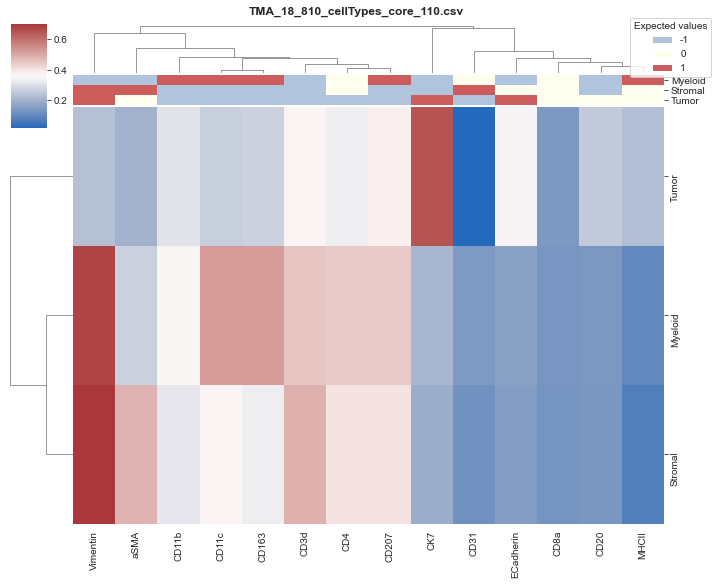

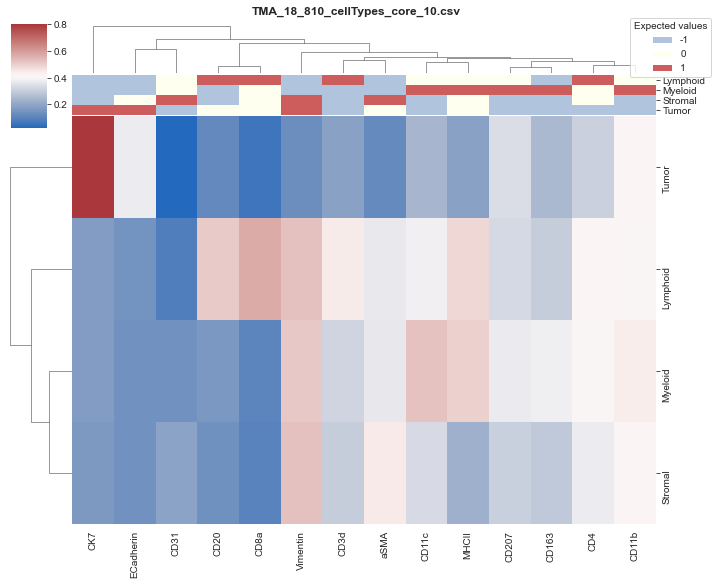

In [14]:
for i in range(nr_of_samples):
    get_heatmap(cell_type_subsets_filtered[i], all_cell_types[i], samples[i], no_trans, cell_type_description_filtered)

### Z-score transformation

In [15]:
def z_score_(df):
    print(df)
    z_scores = df.drop(['labels'], axis=1).apply(stats.zscore, axis = 1)
    z_scores['labels'] = df['labels']
    return z_scores

In [16]:
def z_score(df):
    return df.apply(stats.zscore)

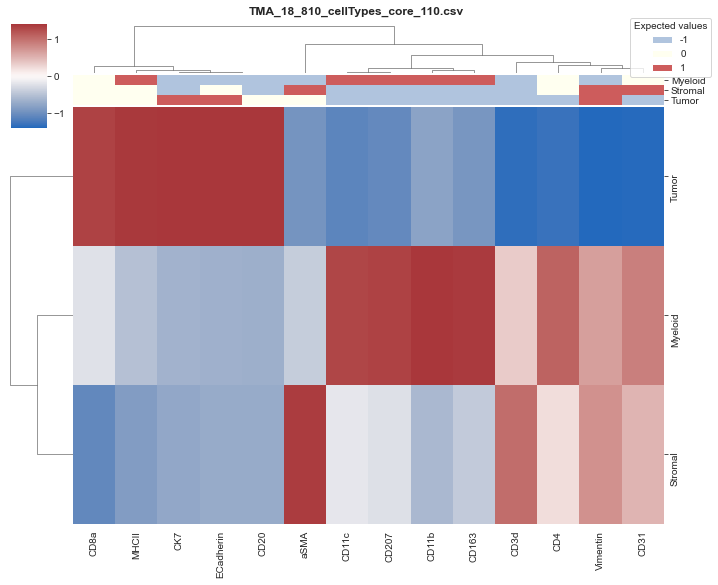

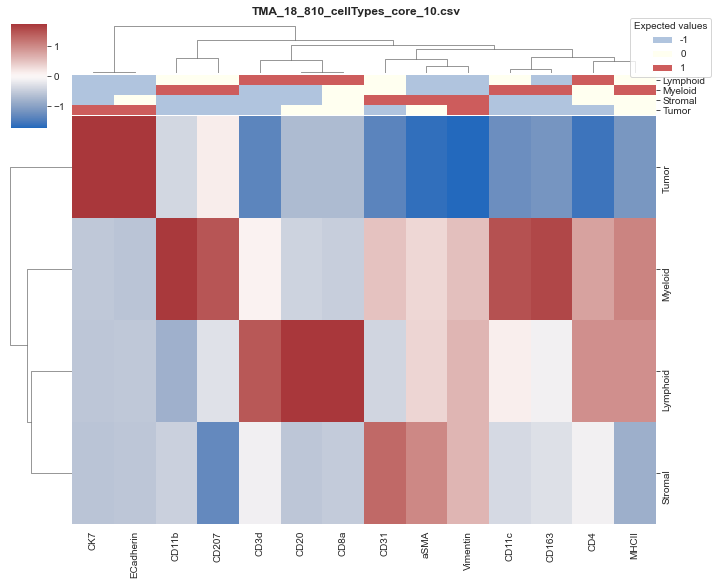

In [17]:
median_dfs = []
for i in range(nr_of_samples):
    median_dfs.append(get_heatmap(cell_type_subsets_filtered[i], all_cell_types[i], samples[i], z_score, cell_type_description_filtered))

## Evaluation scores

In [18]:
def calculate_correlation(medians, expected_values):
    new_medians = medians.transpose()
    similarities = []
    for i in list(new_medians.columns):
        predicted = new_medians[i]
        expected = expected_values[i]
        similarity = stats.multiscale_graphcorr(np.asarray(predicted), np.asarray(expected))
        similarities.append(similarity[0])
        print(i, similarity[0])
        #similarities.append(np.sum(np.array(predicted) == np.array(expected)) / len(list(predicted)))
    print('average score', np.mean(similarities))
    return (np.mean(similarities))

In [19]:
def calculate_similarity(medians, threshold, expected_values):
    new_medians = medians.transpose()
    similarities = []
    for i in list(new_medians.columns):
        predicted = np.array([-1 if num < -1*threshold else 1 if num > threshold else 0 for num in new_medians[i]])
        expected = expected_values[i]
        similarity = cosine_similarity([list(predicted), list(expected)])
        print(i, similarity[0][1])
        similarities.append(similarity[0][1])
    print('average score', np.mean(similarities))
    return (np.mean(similarities))

In [20]:
def calculate_classification(medians, threshold, expected_values, multiply):
    new_medians = medians.transpose()
    similarities = []
    for i in list(new_medians.columns):
        predicted = np.array([-1 if num < -1*threshold else 1 if num > threshold else 0 for num in new_medians[i]])
        expected = np.asarray(expected_values[i])
        weights = [multiply if num == 1 else 1 for num in expected]
        similarity = matthews_corrcoef(expected, predicted, sample_weight=weights)
        similarities.append(similarity)
        print(i, similarity)
    print('average score', np.mean(similarities))
    return (np.mean(similarities))

In [21]:
for i in range(nr_of_samples):
    print(samples[i])
    print()
    print('Classification based metric')
    calculate_classification(median_dfs[i], 0.5, cell_type_description_filtered, 100)
    print()
    print('Correlation based metric')
    calculate_correlation(median_dfs[i], cell_type_description_filtered )
    print()
    print('Cosine similarity based metric')
    calculate_similarity(median_dfs[i], 0.5, cell_type_description_filtered)
    print()

TMA_18_810_cellTypes_core_110.csv

Classification based metric
Myeloid 0.12583739695614554
Stromal 0.6586728784914788
Tumor 0.15927477146432398
average score 0.3145950156373161

Correlation based metric
Myeloid 0.4384845620239024
Stromal 0.22345752695573873
Tumor 0.4986541661463143
average score 0.38686541837531846

Cosine similarity based metric
Myeloid 0.45454545454545464
Stromal 0.49999999999999994
Tumor 0.6761234037828132
average score 0.5435562861094226

TMA_18_810_cellTypes_core_10.csv

Classification based metric
Lymphoid 0.7223643527716311
Myeloid 0.6903219989299674
Stromal 0.6731751580377638
Tumor 0.1727343586857397
average score 0.5646489671062754

Correlation based metric
Lymphoid 0.4443680724398728
Myeloid 0.6836939942267309
Stromal 0.5777157422510361
Tumor 0.1725503577393206
average score 0.4695820416642401

Cosine similarity based metric
Lymphoid 0.5555555555555555
Myeloid 0.6030226891555273
Stromal 0.6324555320336759
Tumor 0.5477225575051662
average score 0.5846890835624

## Score heatmaps

In [24]:
def truncate(n, decimals=0):
    multiplier = 10 ** decimals
    return int(n * multiplier) / multiplier

def round_up(n, decimals=0):
    multiplier = 10 ** decimals
    return math.ceil(n * multiplier) / multiplier

In [25]:
def create_palettes(data, palette):
    data = list(data)
    minimum = truncate(np.min(data), 2)
    maximum = round_up(np.max(data), 2)
    derivalt = (maximum-minimum)/6
    color_palette = []

    for i in range(len(data)):
        if data[i] < minimum + derivalt:
            color_palette.append(palette[0])

        elif data[i] < minimum + derivalt*2:
            color_palette.append(palette[1])

        elif data[i] < minimum + derivalt*3:
            color_palette.append(palette[2])

        elif data[i] < minimum + derivalt*4:
            color_palette.append(palette[3])

        elif data[i] < minimum + derivalt*5:
            color_palette.append(palette[4])

        else:
            color_palette.append(palette[5])
    return color_palette

In [26]:
def create_complex_heatmaps(score_data, cell_type_score_data, sample_name):

    columns = cell_type_score_data.drop('label.1', axis = 1).columns
    palette = sns.color_palette(sns.light_palette("purple"), 6)
    df_colors = pd.DataFrame()

    for i in columns:
        cell = cell_type_score_data[i]
        color_palette = create_palettes(cell, palette)
        lut = dict(zip(cell, color_palette))
        row_colors = cell.map(lut)
        df_colors[i] = row_colors
    df_colors = df_colors.set_index(score_data.index)

    palette = sns.color_palette(['lightsteelblue', 'orange','indianred', 'forestgreen' ], len(np.unique(list(cell_type_score_data['label.1']))))
    new_value = cell_type_score_data['label.1']
    lut_cell_types = dict(zip(np.unique(new_value), palette))
    row_colors = new_value.map(lut_cell_types)
    df_colors['cell_types'] = list(row_colors)

    sns.clustermap(score_data.transpose(), figsize=(10, 10), cmap='vlag', col_colors=df_colors, dendrogram_ratio=0.15, colors_ratio=0.015).fig.suptitle(sample_name,fontweight="bold", y=1.01)
    handles = [Patch(facecolor=lut_cell_types[name]) for name in lut_cell_types]
    plt.legend(handles, lut_cell_types, title='Expected values', bbox_to_anchor=(1, 1), bbox_transform=plt.gcf().transFigure, loc='upper right')

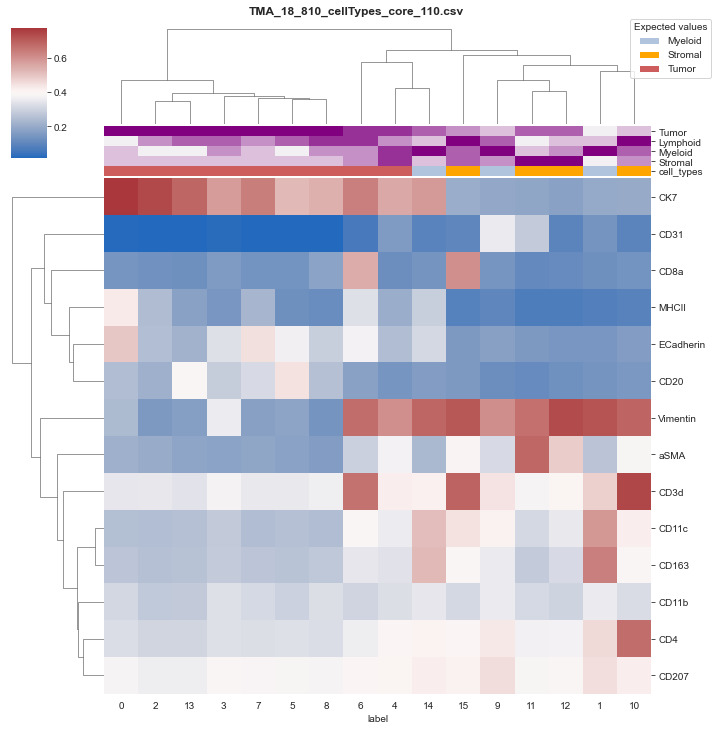

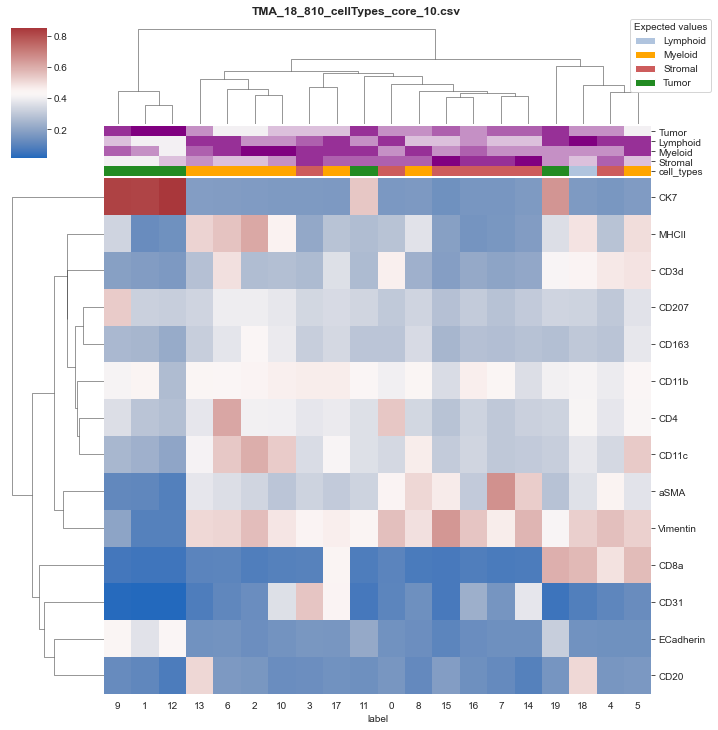

In [34]:
for i in range(nr_of_samples):
    cell_type_score = celltype_scores[i].copy()
    data_score = data_scores[i].copy()
    create_complex_heatmaps(data_score,cell_type_score, samples[i])

## T-SNE/UMAP

In [29]:
def no_trans(table):
    return table

In [30]:
def do_tsne(table, transformation, init, metric, n_iter, perplexity, learning_rate, title, cell_types):
    markers = table.columns
    features = transformation(table)
    features = features.drop(['labels'], axis = 1)
    tsne = pd.DataFrame(
        data = TSNE(n_components = 2, init = init, metric = metric, n_iter= n_iter, perplexity= perplexity, learning_rate= learning_rate).fit_transform(features), columns = ["component 1", "component 2"])

    rows = math.ceil(len(markers)/3)
    fig, ax = plt.subplots(rows, 3, figsize = (25, 30))
    fig.suptitle(title, fontsize=30)

    for i in range(len(markers)):
        if markers[i] == 'labels':
            nr_of_colors = len(cell_types)
            palette = sns.color_palette("tab10", nr_of_colors)
            tsne[markers[i]] = table[markers[i]]
            sns.scatterplot(data = tsne, x = "component 1", y = "component 2", ax = ax[int(i/3)][i%3], alpha = 0.8, hue = markers[i], palette= palette)
        else:
            tsne[markers[i]] = table[markers[i]]
            sns.scatterplot(data = tsne, x = "component 1", y = "component 2", ax = ax[int(i/3)][i%3], alpha = 0.8, hue = markers[i], palette='mycolormap')

/Users/farateod/Documents/GitHub/tribus/venv/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(
/Users/farateod/Documents/GitHub/tribus/venv/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


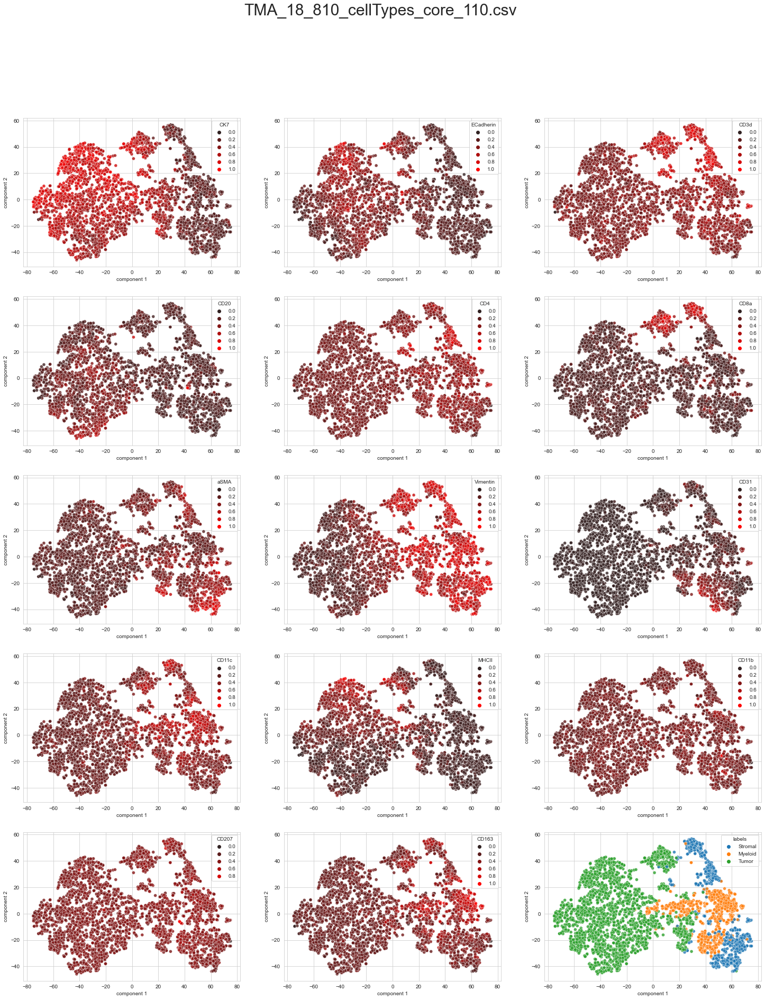

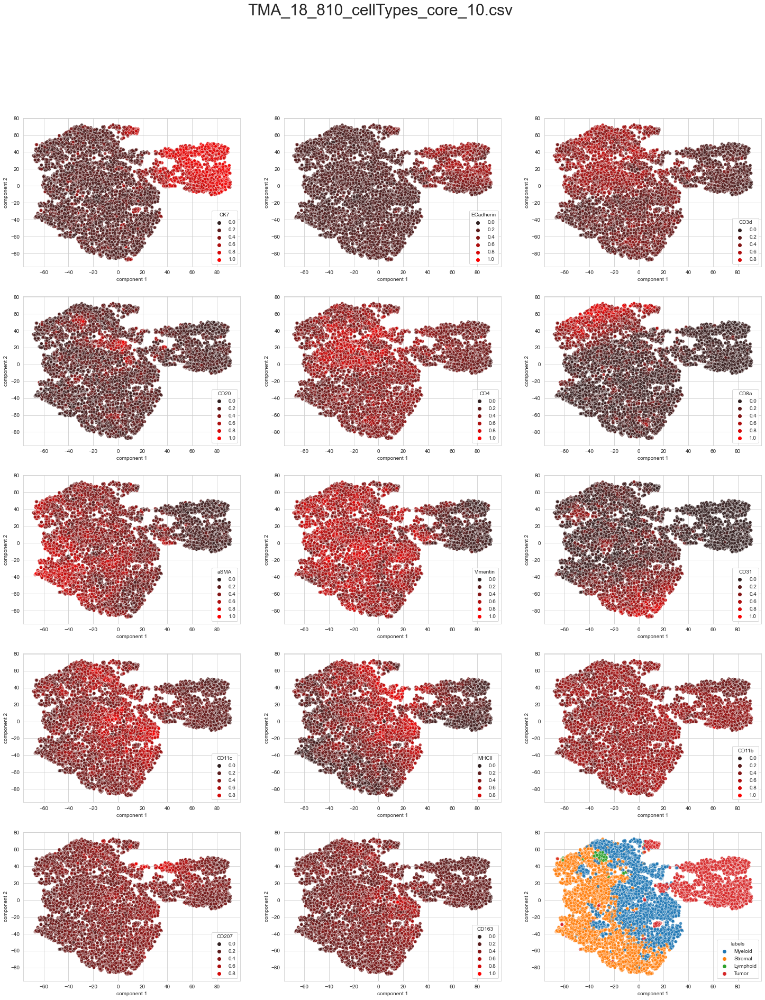

In [31]:
for i in range(nr_of_samples):
    do_tsne(filtered_samples[i], no_trans, 'pca', metric='cosine',  n_iter= 1000, perplexity= 25, learning_rate= 300, title = samples[i], cell_types=all_cell_types[i])

## UMAP

In [32]:
def do_umap(table, transformation, title, cell_types, n_components=2, init='spectral', random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation'):
    markers = table.columns
    features = transformation(table)
    features = features.drop(['labels'], axis = 1)

    proj_2d = pd.DataFrame(data = UMAP(n_components=n_components, init=init, random_state=random_state, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric).fit_transform(features), columns = ["component 1", "component 2"])
    rows = math.ceil(len(markers)/3)
    fig, ax = plt.subplots(rows, 3, figsize = (25, 30))
    fig.suptitle(title, fontsize=30)

    for i in range(len(markers)):
        if markers[i] == 'labels':
            nr_of_colors = len(cell_types)
            palette = sns.color_palette("tab10", nr_of_colors)
            proj_2d[markers[i]] = table[markers[i]]
            sns.scatterplot(data = proj_2d, x = "component 1", y = "component 2", ax = ax[int(i/3)][i%3], alpha = 0.8, hue = markers[i], palette = palette )
        else:
            proj_2d[markers[i]] = table[markers[i]]

            sns.scatterplot(data = proj_2d, x = "component 1", y = "component 2", ax = ax[int(i/3)][i%3], alpha = 0.8, hue = markers[i], palette = 'mycolormap' )

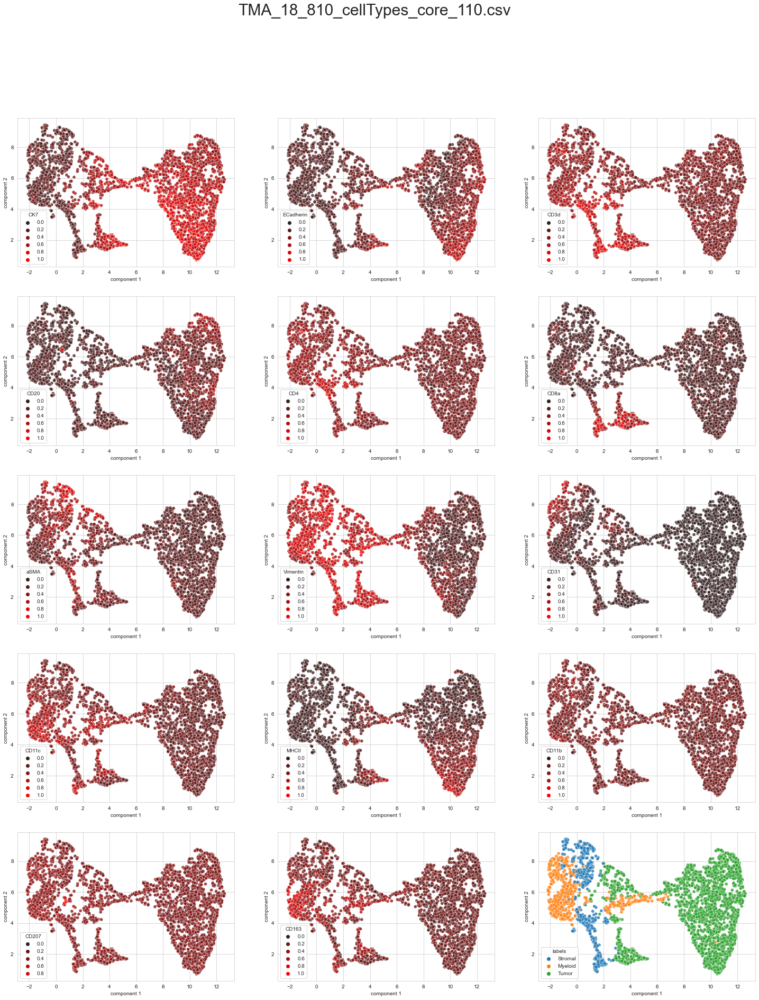

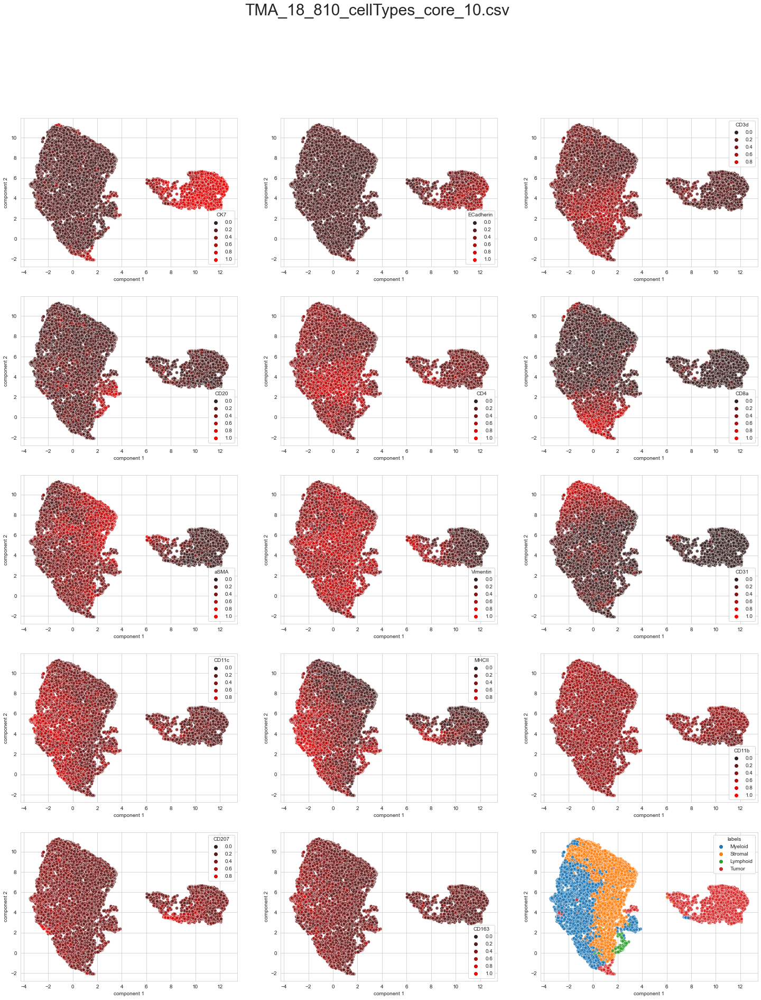

In [33]:
for i in range(nr_of_samples):
    do_umap(filtered_samples[i], no_trans, title=samples[i], cell_types=all_cell_types[i])